<h1>Can Reader</h1>
This is a POC for a can reader. In this case we take a CAN recording in MF4 file format and a dbc file to decode the raw CAN data. To read the CAN data from an MF4 file we will use the asammdf library, and to read the dbc we will use the cantools library.
We will parse the data into a DataFrame and analyze select data, including visualization.

In [1]:
from asammdf import MDF
import cantools
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

We will load the MF4 and DBC files and see what channels we have from the RAW can recording.

In [2]:
mf4_path = "./audi_can.mf4"
dbc_path = "./test_dbc.dbc"

In [3]:
mdf = MDF(mf4_path)
dbc = cantools.database.load_file(dbc_path)

In [4]:
print(mdf.channels_db)

{'Timestamp': ((0, 0), (2, 0)), 'CAN_DataFrame': ((0, 1),), 'CAN_DataFrame.BusChannel': ((0, 2),), 'CAN_DataFrame.ID': ((0, 3),), 'CAN_DataFrame.IDE': ((0, 4),), 'CAN_DataFrame.DLC': ((0, 5),), 'CAN_DataFrame.DataLength': ((0, 6),), 'CAN_DataFrame.DataBytes': ((0, 7),), 'CAN_DataFrame.Dir': ((0, 8),), 'CAN_DataFrame.EDL': ((0, 9),), 'CAN_DataFrame.BRS': ((0, 10),), 'LIN_Frame': ((2, 1),), 'LIN_Frame.BusChannel': ((2, 2),), 'LIN_Frame.ID': ((2, 3),), 'LIN_Frame.DataLength': ((2, 4),), 'LIN_Frame.ReceivedDataByteCount': ((2, 5),), 'LIN_Frame.Dir': ((2, 6),), 'LIN_Frame.DataBytes': ((2, 7),)}


We will parse the raw CAN data to a DataFrame.

In [5]:
df = mdf.to_dataframe()

print(df.head())

            CAN_DataFrame.CAN_DataFrame.BusChannel  \
timestamps                                           
0.00000                                          1   
0.00750                                          1   
0.06000                                          1   
0.06750                                          1   
0.07995                                          1   

            CAN_DataFrame.CAN_DataFrame.ID  CAN_DataFrame.CAN_DataFrame.IDE  \
timestamps                                                                    
0.00000                               2025                                0   
0.00750                               2024                                0   
0.06000                               2025                                0   
0.06750                               2024                                0   
0.07995                               2025                                0   

            CAN_DataFrame.CAN_DataFrame.DLC  \
timestamps          

The relevant columns are the ID and DataBytes columns. The ID column contains the encoded ID of the signal the and the DataBytes contains the encoded data for the specific signal. The encoding of the DataBytes is in a form of an array.Now we will use the corresponding DBC to decode the two columns and put the data into a dataframe:

In [6]:
decoded_rows = []

for ts, row in df.iterrows():
    can_id = row["CAN_DataFrame.CAN_DataFrame.ID"]
    data_bytes = bytes(row["CAN_DataFrame.CAN_DataFrame.DataBytes"])
    try:
        message = dbc.get_message_by_frame_id(can_id)
        decoded = message.decode(data_bytes)
        decoded_rows.append({"timestamp": ts, "id": can_id, **decoded})
    except KeyError:
        pass

decoded_df = pd.DataFrame(decoded_rows)

Let look at the decoded dataframe:

In [7]:
print(decoded_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68624 entries, 0 to 68623
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   timestamp                     68624 non-null  float64
 1   id                            68624 non-null  int64  
 2   Length                        68624 non-null  int64  
 3   Response                      68624 non-null  int64  
 4   Service                       68624 non-null  object 
 5   S01PID                        68624 non-null  object 
 6   S01PID05_EngineCoolantTemp    4166 non-null   float64
 7   S01PID0C_EngineRPM            20687 non-null  float64
 8   S01PID0D_VehicleSpeed         20701 non-null  float64
 9   S01PID11_ThrottlePosition     20576 non-null  float64
 10  S01PID00_PIDsSupported_01_20  1 non-null      float64
 11  S01PID20_PIDsSupported_21_40  1 non-null      float64
 12  S01PID40_PIDsSupported_41_60  1 non-null      float64
 13  S

In [8]:
print(decoded_df.head())

   timestamp    id  Length  Response             Service  \
0    0.00750  2024       3         4  Show current data    
1    0.06750  2024       4         4  Show current data    
2    0.08745  2024       3         4  Show current data    
3    0.12865  2024       3         4  Show current data    
4    0.26750  2024       4         4  Show current data    

                       S01PID  S01PID05_EngineCoolantTemp  S01PID0C_EngineRPM  \
0  S01PID05_EngineCoolantTemp                        37.0                 NaN   
1          S01PID0C_EngineRPM                         NaN               688.0   
2       S01PID0D_VehicleSpeed                         NaN                 NaN   
3   S01PID11_ThrottlePosition                         NaN                 NaN   
4          S01PID0C_EngineRPM                         NaN               688.0   

   S01PID0D_VehicleSpeed  S01PID11_ThrottlePosition  \
0                    NaN                        NaN   
1                    NaN                  

We can see that there are a lot of signals, such as Speed and Engine RPM. For this exercise we will look at Vehicle Speed and Throttle Position:

In [9]:
filtered_df = decoded_df[['timestamp', 'S01PID0D_VehicleSpeed', 'S01PID11_ThrottlePosition']].copy()

In [10]:
filtered_df = filtered_df.reset_index().rename(columns={'timestamp': 'Timestamp', 'S01PID0D_VehicleSpeed': 'VehicleSpeed', 'S01PID11_ThrottlePosition': 'ThrottlePosition'})

In [11]:
print(filtered_df.info())
print(filtered_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68624 entries, 0 to 68623
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             68624 non-null  int64  
 1   Timestamp         68624 non-null  float64
 2   VehicleSpeed      20701 non-null  float64
 3   ThrottlePosition  20576 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 2.1 MB
None
   index  Timestamp  VehicleSpeed  ThrottlePosition
0      0    0.00750           NaN               NaN
1      1    0.06750           NaN               NaN
2      2    0.08745           0.0               NaN
3      3    0.12865           NaN           13.7256
4      4    0.26750           NaN               NaN


We see that there is a lot of Null values. We cannot remove all the Nulls as we will lose too much data in this case. We can assume that the throttle input and the vehicle speed change in a linear fashion, so we will do Linear Interpolation to fill in the Nulls:

In [12]:
filtered_df = filtered_df.interpolate(method='linear')
print(filtered_df.info())
print(filtered_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68624 entries, 0 to 68623
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             68624 non-null  int64  
 1   Timestamp         68624 non-null  float64
 2   VehicleSpeed      68622 non-null  float64
 3   ThrottlePosition  68621 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 2.1 MB
None
   index  Timestamp  VehicleSpeed  ThrottlePosition
0      0    0.00750           NaN               NaN
1      1    0.06750           NaN               NaN
2      2    0.08745           0.0               NaN
3      3    0.12865           0.0           13.7256
4      4    0.26750           0.0           13.7256


We still have a couple of Null values, but they are insignificant, so we will just remove them:

In [13]:
filtered_df = filtered_df.dropna().reset_index(drop=True)
print(filtered_df.info())
print(filtered_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68621 entries, 0 to 68620
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             68621 non-null  int64  
 1   Timestamp         68621 non-null  float64
 2   VehicleSpeed      68621 non-null  float64
 3   ThrottlePosition  68621 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 2.1 MB
None
   index  Timestamp  VehicleSpeed  ThrottlePosition
0      3    0.12865           0.0           13.7256
1      4    0.26750           0.0           13.7256
2      5    0.28765           0.0           13.7256
3      6    0.32755           0.0           13.7256
4      7    0.46750           0.0           13.7256


Let's visualize the clean data we got using seaborn library:

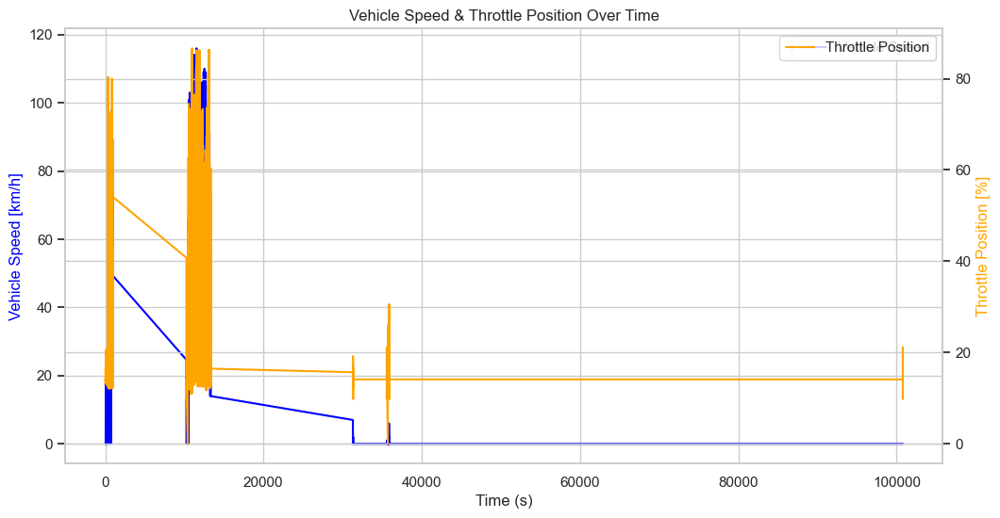

In [14]:
# Set Seaborn style
sns.set(style="whitegrid")

# Plot both signals over time
fig, ax1 = plt.subplots(figsize=(12,6))

ax2 = ax1.twinx()
sns.lineplot(data=filtered_df, x="Timestamp", y="VehicleSpeed", ax=ax1, color="blue", label="Vehicle Speed")
sns.lineplot(data=filtered_df, x="Timestamp", y="ThrottlePosition", ax=ax2, color="orange", label="Throttle Position")

ax1.set_xlabel("Time (s)")
ax1.set_ylabel("Vehicle Speed [km/h]", color="blue")
ax2.set_ylabel("Throttle Position [%]", color="orange")

plt.title("Vehicle Speed & Throttle Position Over Time")
plt.show()

The data is pretty messy. We will now use plotly to visualize. It will allow us to zoom into the data and look at specific data points.

In [15]:
fig = go.Figure()

# Add Vehicle Speed trace
fig.add_trace(go.Scatter(
    x=filtered_df["Timestamp"],
    y=filtered_df["VehicleSpeed"],
    mode='lines',
    name='Vehicle Speed',
    line=dict(color='blue')
))

# Add Throttle Position trace
fig.add_trace(go.Scatter(
    x=filtered_df["Timestamp"],
    y=filtered_df["ThrottlePosition"],
    mode='lines',
    name='Throttle Position',
    line=dict(color='orange'),
    yaxis='y2'  # Second y-axis
))

# Layout with dual y-axes
fig.update_layout(
    title="Vehicle Speed & Throttle Position Over Time",
    xaxis=dict(title="Time (s)"),
    yaxis=dict(title="Vehicle Speed [km/h]"),
    yaxis2=dict(
        title="Throttle Position [%]",
        overlaying='y',
        side='right'
    ),
    hovermode="x unified",  # Show both values on hover
    template="plotly_white"
)

fig.show()

Let's calculate some stats:

In [16]:
print("Average Speed:", filtered_df[["VehicleSpeed"]].mean())
print("Median Speed:", filtered_df[["VehicleSpeed"]].median())
print("Standard Deviation:", filtered_df[["VehicleSpeed"]].std())
print(filtered_df["VehicleSpeed"].corr(filtered_df["ThrottlePosition"]))

Average Speed: VehicleSpeed    70.071589
dtype: float64
Median Speed: VehicleSpeed    85.0
dtype: float64
Standard Deviation: VehicleSpeed    37.540125
dtype: float64
0.4747986507770048


<h2>Conclusions:</h2>

* We see that there is a correlation of 0.48 between the throttle input and the vehicle speed. It is a moderate correlation, which makes sense as the speed doesn't jump exactly according to throttle input but changes gradually by the trend of the throttle input.

* We can visualise all kinds of data if we have CAN data and the correct DBC. From the data analysis point of view there are a lot of missing data, so we need to determine for each case what to do with the missing data, taking into account that we are dealing with physical data from a vehicle.

* This notebook can be used for all kinds of MF4 files, given you have the correct DBC file. The column names can be different for different data, so you will need to change the code accordingly.